# ASAP Human Postmortem-Derived Brain Sequencing Collection (PMDBS): Mapping to the Whole Human Brain Taxonomy 

In the [previous notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_data_and_metadata.html), we provided an overview of the ASAP PMDBS dataset and associated cell, sample and donor metadata.  In this notebook we demonstrated the use of Allen Institute’s MapMyCells tool to provide cell type insight to the PMDBS dataset. 

[MapMyCells](https://knowledge.brain-map.org/mapmycells/process/)([RRID: SCR_024672](https://scicrunch.org/resources/data/record/nlx_144509-1/SCR_024672/resolver?q=MapMyCells&l=MapMyCells&i=rrid:scr_024672)) transforms cell types from a concept in publications to a tool for public research. Scientists worldwide can discover what cell types their transcriptomics and spatial data corresponds with by comparing their data to massive, high-quality reference datasets using multiple mapping methods. Currently available taxonomies include 10X whole mouse brain taxonomy, 10X whole human brain taxonomy and 10X Human MTG SEA-AD taxonomy. Available algorithms include correlation mapping (flatmap), hierarchical correlation mapping and a deep generative model-based algorithm. 

In this notebook, we will map the approximately 3 million cells of PMDBS to the 10X whole human brain taxonomy (Siletti et. al.) using the hierarchical correlation mapping method where assignments are first made at the top level of the taxonomy using mean gene expression profiles of the reference dataset and pre-selected set of marker genes to distinguish cluster from its sibling. For robustness, the process is repeated 100 times, using 50% of the marker genes each time. A cell is assigned the class that receives the plurality of votes, a probability and correlation score. This process is repeated down the taxonomy until the last finest level. In this notebook we walkthrough the output of the MapMyCells results. 

You need to be connected to the internet to run this notebook and should have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the AbcProjectCache. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

Change the download_base variable to where you have downloaded the data in your system.

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(download_base)

abc_cache.current_manifest

'releases/20250531/manifest.json'

## Data Overview

### ASAP Data

We simplify the ASAP PMDB metadata into a single cell_metadata, csv file and there companion tables describing the donor (including sex, age, race, disease state etc.), sample (including data processing metadata, team information, and dissection or region of interest the sample is from), and value_sets which provides a mapping from unique term name (cell type, region of interest etc.) to a plotting color and order.

In [3]:
cell_metadata = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='cell_metadata'
).set_index('cell_label')
donor = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='donor'
).set_index('donor_label')
sample = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='sample'
).set_index('sample_label')
value_sets = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-10X',
    file_name='value_sets'
).set_index('label')

As with our previous tutorial, we'll first use a Pandas join to merge the sample data into the cell metadata and then merge the donor information. We'll use the value_sets as a lookup.

In [4]:
cell_metadata = cell_metadata.join(sample, on='sample_label')
cell_metadata = cell_metadata.join(donor, on='donor_label')
cell_metadata.head()

,cell_barcode,sample_label,x,y,cluster_label,cluster_label_order,cluster_label_color,dataset_label,feature_matrix_label,abc_sample_id,...,cerad_score_color,cognitive_status,cognitive_status_order,cognitive_status_color,lewy_body_disease_pathology,lewy_body_disease_pathology_order,lewy_body_disease_pathology_color,thal_phase,thal_phase_order,thal_phase_color
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAACCAT-1_ASAP_PMBDS_000060_s002_Rep1,AAACCCAAGAAACCAT-1,ASAP_PMBDS_000060_s002,0.016373,1.403025,cluster_000,1,#171c97,ASAP-PMDBS-10X,ASAP-PMDBS-10X,cc633260-614c-4e5c-aa18-d3e3a0ef81bb,...,#4daf4a,Unknown,4,#e8e8e8,Absent,1,#ffffd9,Thal 3,4,#df65b0
AAACCCAAGAAACTCA-1_ASAP_PMBDS_000088_s001_Rep1,AAACCCAAGAAACTCA-1,ASAP_PMBDS_000088_s001,10.029368,1.342043,cluster_013,14,#aa5ed0,ASAP-PMDBS-10X,ASAP-PMDBS-10X,4b4f4355-6463-4bf2-9544-3f6d493de741,...,#4daf4a,Unknown,4,#e8e8e8,Absent,1,#ffffd9,Thal 2,3,#c994c7
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000177_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000177_s001,-9.057206,-1.032092,cluster_006,7,#f591a5,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0ea675f3-4b39-4c16-9518-66ddd9c409a1,...,#e41a1c,Mild Cognitive Impairment,2,#377eb8,Brainstem/Limbic,5,#41b6c4,Thal 3,4,#df65b0
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000185_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000185_s001,-0.685645,-4.943793,cluster_001,2,#e4a9ba,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0eb0506b-e76b-4f9a-a3b6-bc6bbccfdd32,...,#e41a1c,Mild Cognitive Impairment,2,#377eb8,Brainstem predominant,4,#7fcdbb,Thal 3,4,#df65b0
AAACCCAAGAAATCCA-1_ASAP_PMBDS_000122_s002_1,AAACCCAAGAAATCCA-1,ASAP_PMBDS_000122_s002,-3.507261,13.855699,cluster_002,3,#a02226,ASAP-PMDBS-10X,ASAP-PMDBS-10X,1f67fc2a-7e81-4448-8437-e2c6ef8b4b1b,...,#e8e8e8,Unknown,4,#e8e8e8,Unknown,10,#e8e8e8,Unknown,8,#e8e8e8


### Loading MapMyCells Results 

We load the MapMyCells hierarchical correlation mapping to 10X whole human brain taxonomy results. These are calculated for each cell and can be merged into our cell_metadata table on cell_label index. For more information on MapMyCells see [here](https://portal.brain-map.org/atlases-and-data/bkp/mapmycells).

In [5]:
siletti_mmc_results = abc_cache.get_metadata_dataframe(
    directory='ASAP-PMDBS-taxonomy',
    file_name='mmc_results_siletti_whb',
    comment='#'
).set_index('cell_label')
siletti_mmc_results.head()

mmc_results_siletti_whb.csv: 100%|██████████| 1.11G/1.11G [01:56<00:00, 9.59MMB/s]   


,supercluster_label,supercluster_name,supercluster_bootstrapping_probability,supercluster_correlation_coefficient,supercluster_aggregate_probability,cluster_label,cluster_name,cluster_bootstrapping_probability,cluster_correlation_coefficient,cluster_aggregate_probability,subcluster_label,subcluster_name,cluster_alias,subcluster_bootstrapping_probability,subcluster_correlation_coefficient,subcluster_aggregate_probability
cell_label,,,,,,,,,,,,,,,,
AGCGATTCAGAATGTA-1_ASAP_PMBDS_000105_s001_1,CS202210140_467,Oligodendrocyte precursor,1.00,0.8196,1.00,CS202210140_34,OPC_33,1.00,0.5419,1.00,CS202210140_3538,OPC_33_3044,3044,0.75,0.3870,0.7500
GGTGAAGCAGACAATA-1_ASAP_PMBDS_000105_s001_1,CS202210140_469,Oligodendrocyte,1.00,0.8066,1.00,CS202210140_50,Oligo_49,0.97,0.6461,0.97,CS202210140_3494,Oligo_49_3000,3000,0.60,0.3379,0.5820
ATTTACCGTTCTAACG-1_ASAP_PMBDS_000105_s001_1,CS202210140_469,Oligodendrocyte,1.00,0.8252,1.00,CS202210140_45,Oligo_44,0.97,0.6821,0.97,CS202210140_3496,Oligo_44_3002,3002,1.00,0.5014,0.9700
CTCAAGACACGCTTAA-1_ASAP_PMBDS_000105_s001_1,CS202210140_470,Astrocyte,1.00,0.7359,1.00,CS202210140_63,Astro_62,0.94,0.5680,0.94,CS202210140_3618,Astro_62_3124,3124,0.94,0.3598,0.8836
TCGCTTGGTGCGACAA-1_ASAP_PMBDS_000105_s001_1,CS202210140_467,Oligodendrocyte precursor,0.94,0.7004,0.94,CS202210140_34,OPC_33,1.00,0.3904,0.94,CS202210140_3539,OPC_33_3045,3045,0.54,0.2774,0.5076


### 10X Whole Human Brain Taxonomy (Siletti et al.) 

The 10X Whole Human Brain (WHB) Taxonomy is a three-level, cell types hierarchical tree (31 superclusters, 461 clusters and 3313 subclusters) derived from a > 3 million cell reference dataset derived from samples across the whole human brain. Additionally, categorical neurotransmitter type annotations were assigned to each cluster based on expression (or lack thereof) of one or more neurotransmitter-associated marker genes. For more information on these data see [here](https://alleninstitute.github.io/abc_atlas_access/notebooks/WHB-10x_snRNASeq_tutorial_part_1.html). Here we load information about the taxonomy (terms, colors, hierarchy, levels and order) from the  abc_atlas_access cache object.

In [6]:
membership = abc_cache.get_metadata_dataframe(
    directory='WHB-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
)
membership_groupby = membership.groupby(['cluster_alias', 'cluster_annotation_term_set_name'])
membership.head(5)

cluster_to_cluster_annotation_membership.csv: 100%|██████████| 1.02M/1.02M [00:00<00:00, 2.68MMB/s]


,cluster_annotation_term_label,cluster_annotation_term_set_label,cluster_alias,cluster_annotation_term_name,cluster_annotation_term_set_name,number_of_cells,color_hex_triplet
0,CS202210140_494,CCN202210140_SUBC,0,URL_297_0,subcluster,34,#7E807A
1,CS202210140_495,CCN202210140_SUBC,1,URL_308_1,subcluster,220,#C54945
2,CS202210140_496,CCN202210140_SUBC,2,URL_308_2,subcluster,187,#5232B7
3,CS202210140_497,CCN202210140_SUBC,3,URL_308_3,subcluster,246,#31BEBA
4,CS202210140_498,CCN202210140_SUBC,4,URL_308_4,subcluster,188,#C8A9BC


In [7]:
term_sets = abc_cache.get_metadata_dataframe(directory='WHB-taxonomy', file_name='cluster_annotation_term_set').set_index('label')
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_details = cluster_details[term_sets['name']] # order columns
cluster_details.fillna('Other', inplace=True)
cluster_details.sort_values(['supercluster', 'cluster', 'subcluster'], inplace=True)
cluster_details.head()

cluster_annotation_term_set.csv: 100%|██████████| 1.33k/1.33k [00:00<00:00, 12.8kMB/s]


cluster_annotation_term_set_name,subcluster,cluster,supercluster,neurotransmitter
cluster_alias,,,,
2461,Amex_153_2461,Amex_153,Amygdala excitatory,VGLUT1 VGLUT2
2462,Amex_153_2462,Amex_153,Amygdala excitatory,VGLUT1 VGLUT2
2463,Amex_153_2463,Amex_153,Amygdala excitatory,VGLUT1 VGLUT2
2464,Amex_153_2464,Amex_153,Amygdala excitatory,VGLUT1 VGLUT2
2465,Amex_153_2465,Amex_153,Amygdala excitatory,VGLUT1 VGLUT2


In [8]:
cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[term_sets['name']]
cluster_colors.sort_values(['supercluster', 'cluster', 'subcluster'], inplace=True)
cluster_colors.head()

cluster_annotation_term_set_name,subcluster,cluster,supercluster,neurotransmitter
cluster_alias,,,,
2218,#374B8A,#062463,#003380,#2BDFD1
2216,#4BCBC6,#062463,#003380,#2BDFD1
2217,#83C943,#062463,#003380,#2BDFD1
2219,#BC4440,#062463,#003380,#2BDFD1
2220,#CB7ABA,#062463,#003380,#2BDFD1


In [9]:
cluster_annotation_term = abc_cache.get_metadata_dataframe('WHB-taxonomy', 'cluster_annotation_term')
cluster_annotation_term['name'] = cluster_annotation_term['name'].fillna('Other')
cluster_annotation_term.set_index('name', inplace=True)
cluster_annotation_term.head()

cluster_annotation_term.csv: 100%|██████████| 547k/547k [00:00<00:00, 2.14MMB/s] 


,label,cluster_annotation_term_set_label,parent_term_label,parent_term_set_label,term_set_order,term_order,cluster_annotation_term_set_name,color_hex_triplet,number_of_cells,description
name,,,,,,,,,,
Upper-layer intratelencephalic,CS202210140_476,CCN202210140_SUPC,NaN,NaN,0,0,supercluster,#FEA7BA,455006,Upper-layer intratelencephalic
Deep-layer intratelencephalic,CS202210140_477,CCN202210140_SUPC,NaN,NaN,0,1,supercluster,#426600,228467,Deep-layer intratelencephalic
Deep-layer near-projecting,CS202210140_473,CCN202210140_SUPC,NaN,NaN,0,2,supercluster,#EE1010,18856,Deep-layer near-projecting
Deep-layer corticothalamic and 6b,CS202210140_474,CCN202210140_SUPC,NaN,NaN,0,3,supercluster,#5EF0F1,78396,Deep-layer corticothalamic and 6b
MGE interneuron,CS202210140_484,CCN202210140_SUPC,NaN,NaN,0,4,supercluster,#DFFE66,222434,MGE interneuron


Finally, we can merge the cell_metadata with the taxonomy information. We only need to add the Neurotransmitter name/information from our `cluster_details`. We'll join all colors.

In [10]:
cell_siletti = cell_metadata.join(siletti_mmc_results, rsuffix='_siletti')
cell_siletti = cell_siletti.join(
    cluster_details[['neurotransmitter']].rename(columns={'neurotransmitter': 'neurotransmitter_name'}),
    on='cluster_alias'
)
cell_siletti = cell_siletti.join(cluster_colors, on='cluster_alias')
cell_siletti.head()

,cell_barcode,sample_label,x,y,cluster_label,cluster_label_order,cluster_label_color,dataset_label,feature_matrix_label,abc_sample_id,...,subcluster_name,cluster_alias,subcluster_bootstrapping_probability,subcluster_correlation_coefficient,subcluster_aggregate_probability,neurotransmitter_name,subcluster,cluster,supercluster,neurotransmitter
cell_label,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAACCAT-1_ASAP_PMBDS_000060_s002_Rep1,AAACCCAAGAAACCAT-1,ASAP_PMBDS_000060_s002,0.016373,1.403025,cluster_000,1,#171c97,ASAP-PMDBS-10X,ASAP-PMDBS-10X,cc633260-614c-4e5c-aa18-d3e3a0ef81bb,...,Misc_404_2701,2701,1.00,0.4805,0.990,VGLUT1,#767F80,#B7E52E,#FEFE00,#2BDFD1
AAACCCAAGAAACTCA-1_ASAP_PMBDS_000088_s001_Rep1,AAACCCAAGAAACTCA-1,ASAP_PMBDS_000088_s001,10.029368,1.342043,cluster_013,14,#aa5ed0,ASAP-PMDBS-10X,ASAP-PMDBS-10X,4b4f4355-6463-4bf2-9544-3f6d493de741,...,DLCT6b_109_2894,2894,0.96,0.4384,0.768,VGLUT1,#C446B4,#68E5B9,#5EF0F1,#2BDFD1
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000177_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000177_s001,-9.057206,-1.032092,cluster_006,7,#f591a5,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0ea675f3-4b39-4c16-9518-66ddd9c409a1,...,ULIT_138_2778,2778,0.82,0.4664,0.820,VGLUT1 VGLUT2,#474AC5,#F5DC97,#FEA7BA,#22A5BB
AAACCCAAGAAAGCGA-1_ASAP_PMBDS_000185_s001_rep1,AAACCCAAGAAAGCGA-1,ASAP_PMBDS_000185_s001,-0.685645,-4.943793,cluster_001,2,#e4a9ba,ASAP-PMDBS-10X,ASAP-PMDBS-10X,0eb0506b-e76b-4f9a-a3b6-bc6bbccfdd32,...,ULIT_124_2626,2626,0.69,0.4889,0.276,VGLUT1 VGLUT2,#73CDB8,#F0A4E8,#FEA7BA,#22A5BB
AAACCCAAGAAATCCA-1_ASAP_PMBDS_000122_s002_1,AAACCCAAGAAATCCA-1,ASAP_PMBDS_000122_s002,-3.507261,13.855699,cluster_002,3,#a02226,ASAP-PMDBS-10X,ASAP-PMDBS-10X,1f67fc2a-7e81-4448-8437-e2c6ef8b4b1b,...,Oligo_47_3023,3023,1.00,0.3952,0.810,Other,#85BE78,#93B620,#9CBA19,#666666


## UMAP Plotting

We define convenience function to plot the Uniform Manifold Approximation and Projection (UMAP) of the ASAP PMDB data.

In [11]:
def plot_umap(
    xx,
    yy,
    cc=None,
    val=None,
    fig_width=8,
    fig_height=8,
    cmap=None,
    labels=None,
    term_order_lookup=None,
    colorbar=False,
    sizes=None
):
    """
    """
    if sizes is None:
        sizes = 1
    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_labels = labels.unique()
        unique_colors = cc.unique()

        if term_order_lookup is not None:
            term_order = np.argsort(term_order_lookup.loc[unique_labels, 'term_order'])
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=2)
        # ax.add_artist(legend)

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

### Transferred Neurotransmitter Types 

Below are the PMDBS cells colorized by their neurotransmitter types that were inferred from mapping to the WHB taxonomy. Neurotransmitter assignment provides a high-level gestalt of the dataset by dividing the UMAP into glutamergic (shades of blue), GABAergic (reds), their combination (purples) and non-neuronal cells (gray) domains. 

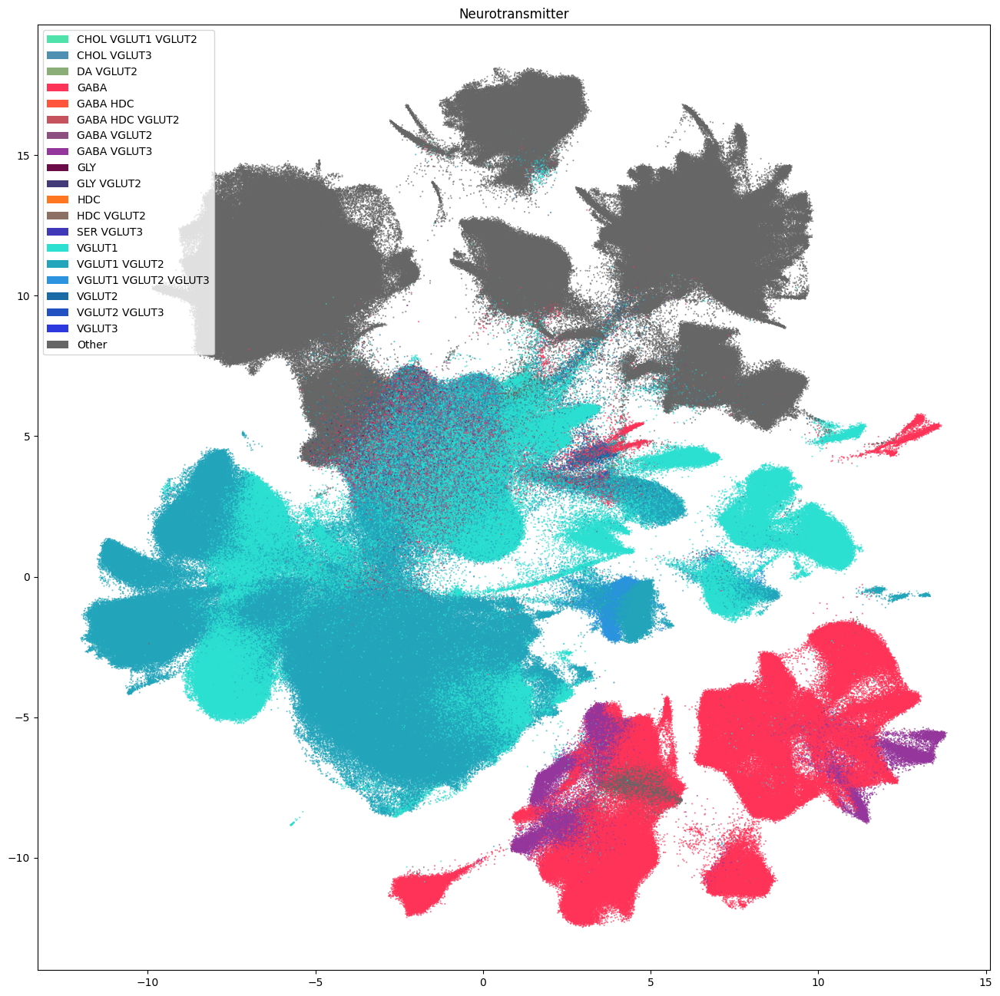

In [12]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    cc=cell_siletti['neurotransmitter'],
    labels=cell_siletti['neurotransmitter_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Neurotransmitter")
plt.show()

### Transferred Whole Human Brain Taxonomy Types 

The next set of plots colorized the PMDBS cells by WHB taxonomy at the supercluster, cluster and subcluster levels. At the supercluster level, we see large swathe of the same colors shows that clusters derived from the scVI integration corresponds well to cell types defined by the WHB taxonomy.  

Major glutamergic cortical supercluster annotation from WHB includes intratelencephalic (IT), corticothalamic (CT), and near-projecting (NP) cortical cells, hippocampal types (dente gyrus, CA1-3 and CA4), amygdala excitatory (AMEX) and upper rhombic lip (URL) cells. GABAergic superclusters include CGE (caudal ganglionic eminence) derived, MGE (medial ganglionic eminence) derived, LAMP5-LHX6 and Chandelier (LLC) cells, medium spiny neurons (MSN) and eccentric MSNs. Non-neuronal superclusters include astrocytes, ependymal, microglia, oligodendrocyte, OPCs (oligodendrocyte precursor), vascular and fibroblast cells. 

The center of the UMAP shows a region of highly mixed assignments, with lower mapping probabilities (shown later) that could potentially indicate issues with data quality and/or batch effect. 

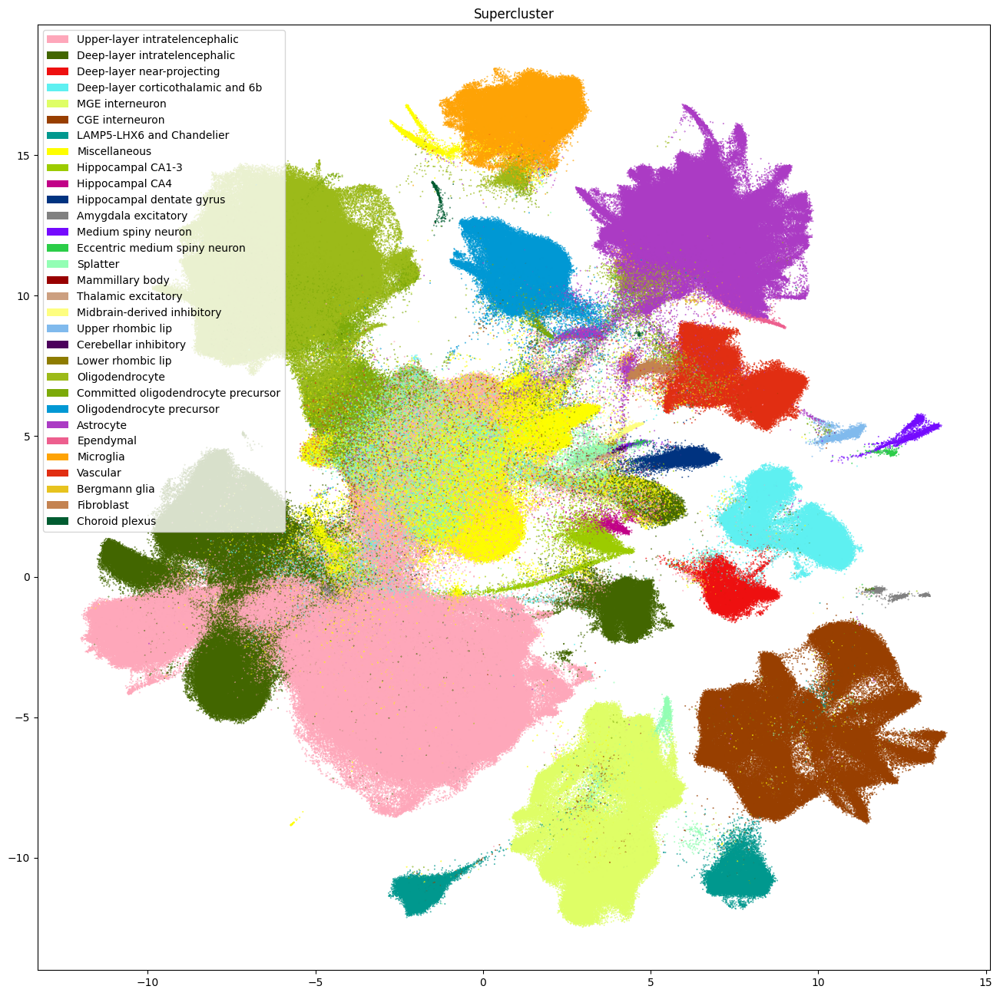

In [13]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    cc=cell_siletti['supercluster'],
    labels=cell_siletti['supercluster_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Supercluster")
plt.show()

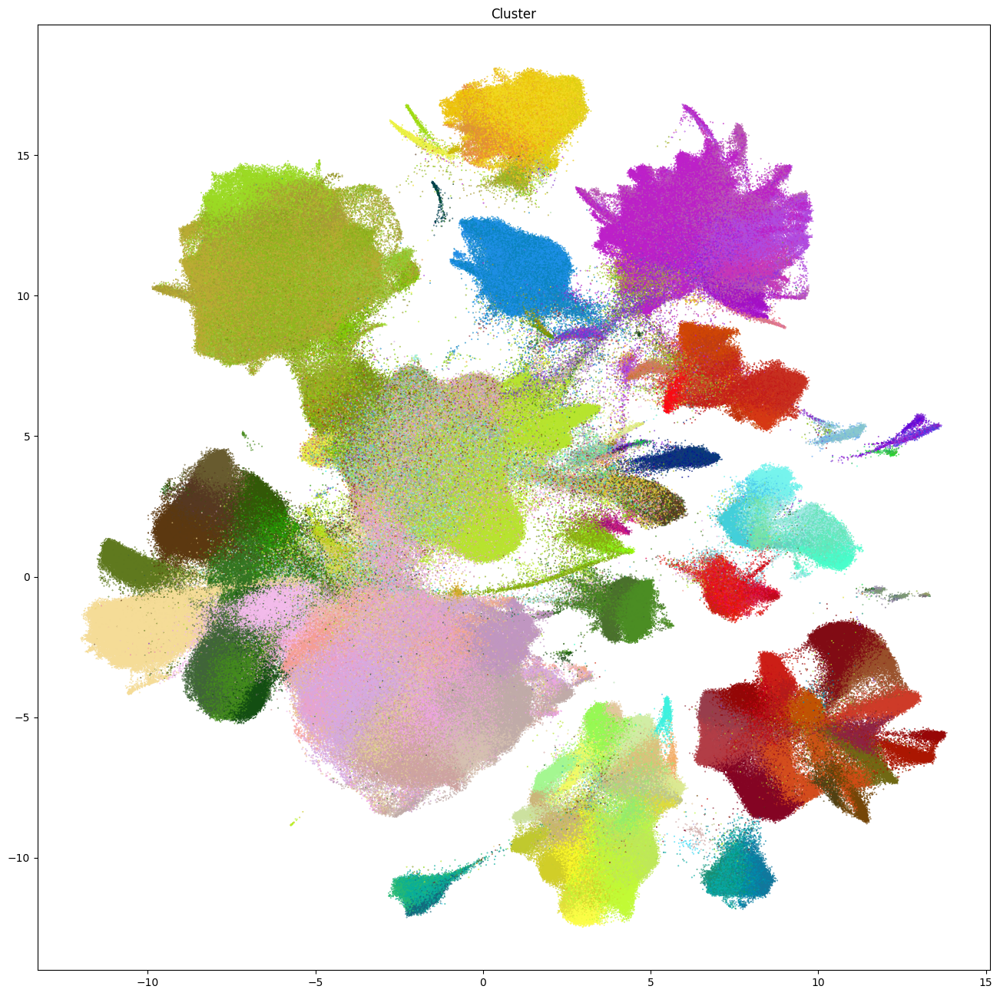

In [14]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    cc=cell_siletti['cluster'],
    fig_width=16,
    fig_height=16
)
res = ax.set_title("Cluster")
plt.show()

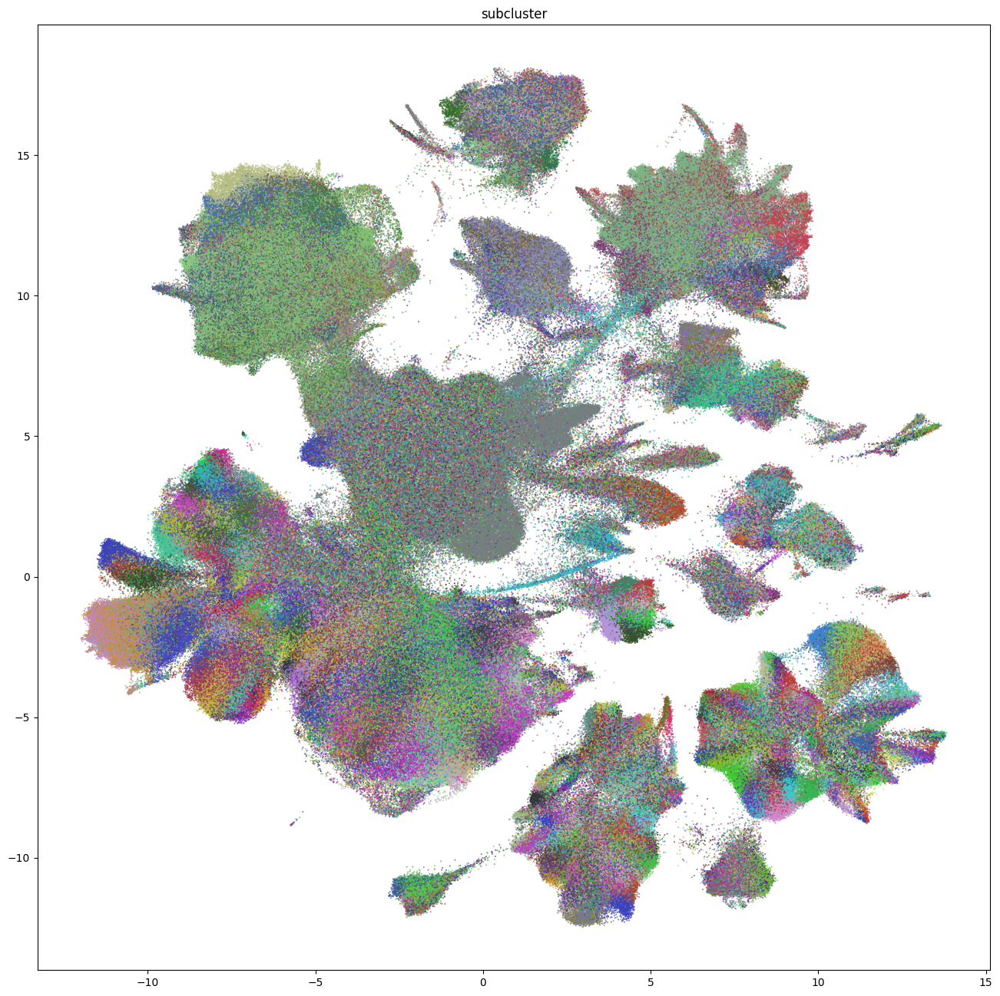

In [15]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    cc=cell_siletti['subcluster'],
    fig_width=16,
    fig_height=16
)
res = ax.set_title("subcluster")
plt.show()

### Assignment Correlation and Probabilities 

For each cell, at each level of the taxonomy, the MapMyCells results provide the following mapping quality metrics: (1) bootstrapping probability: the fraction of bootstrap iterations that chose the assigned node at that level of the taxonomy, (2) aggregate probability: multiplication of the bootstrapping probability at the current level with its parent levels to provide a total probability and (3) correlation coefficient: Pearson's correlation coefficient between the gene expression profile of the cell and the gene expression profile of the assigned node across the set of pre-defined marker genes appropriate to that taxonomic node.

The next set of plots colorized PDMBS cells by the boostrapping probability at each level. Here we see that cells in the center part of the UMAP have the lowest probability mapping at every level and corresponding to where we also see highly mixed supercluster assignments. 

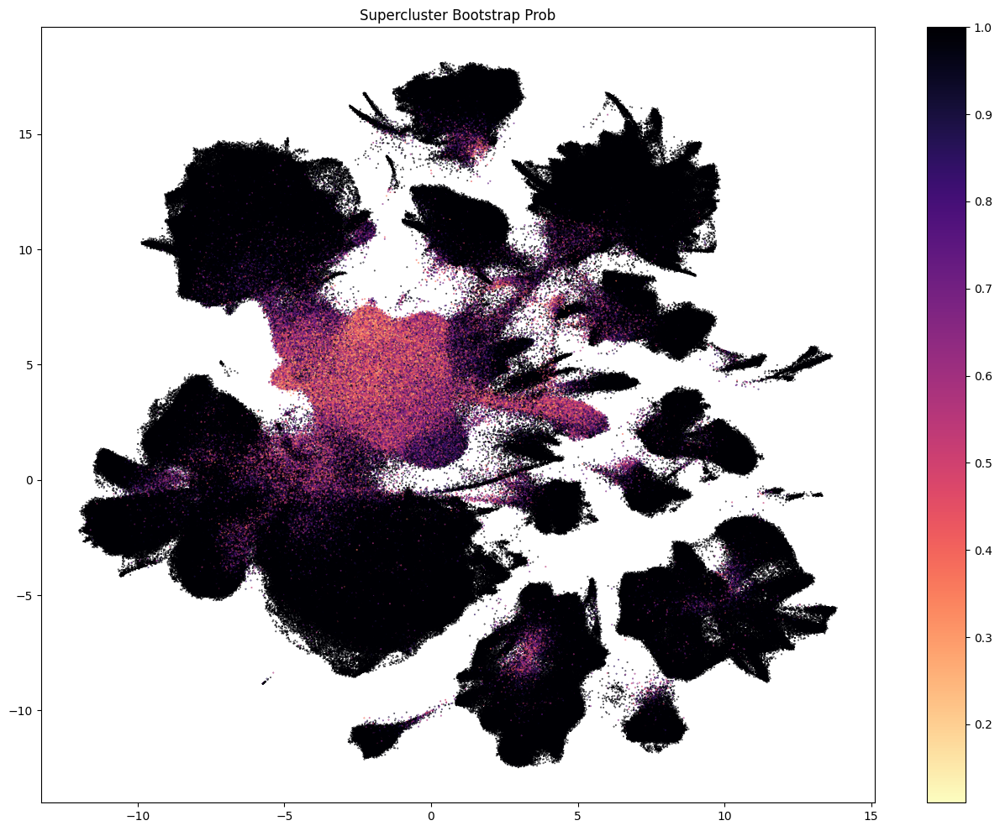

In [16]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    val=cell_siletti['supercluster_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Supercluster Bootstrap Prob")
plt.show()

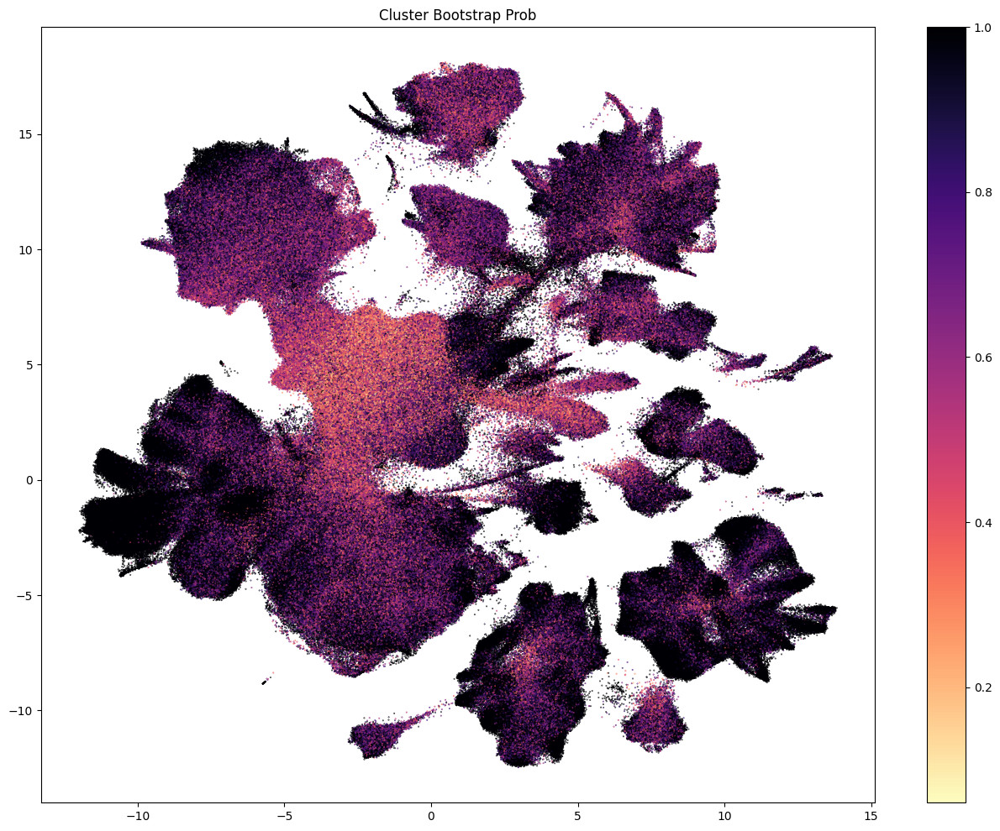

In [17]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    val=cell_siletti['cluster_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Cluster Bootstrap Prob")
plt.show()

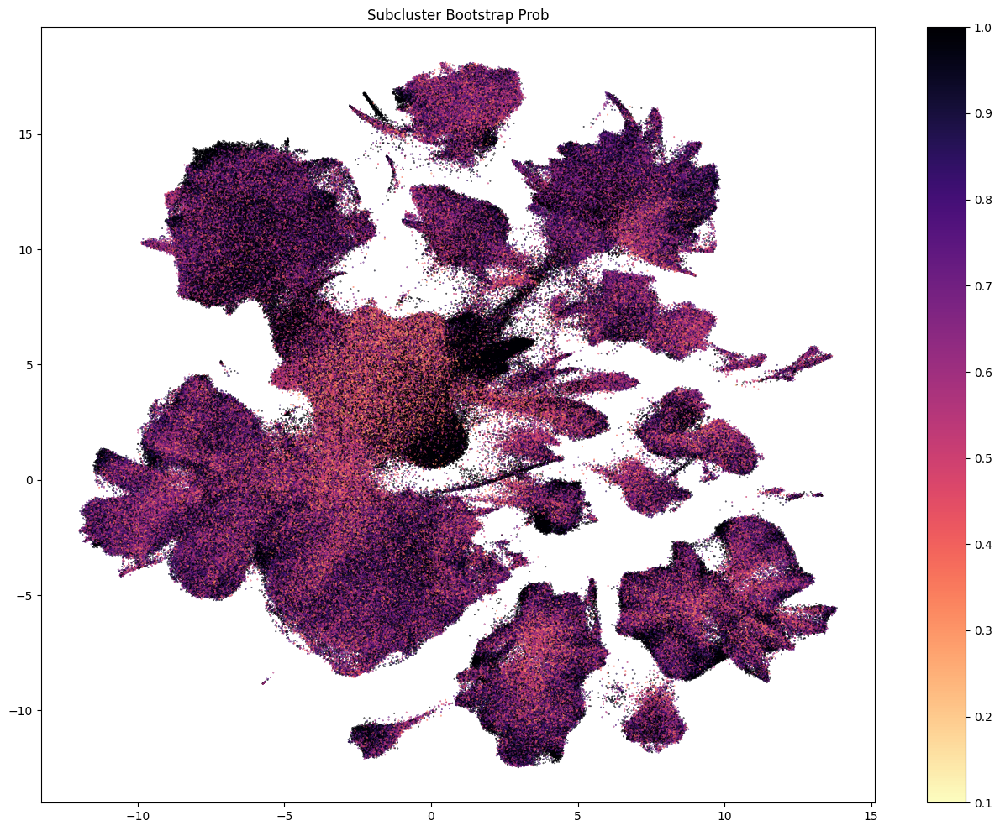

In [18]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    val=cell_siletti['subcluster_bootstrapping_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Subcluster Bootstrap Prob")
plt.show()

Each of the above plots shows the probability of being assigned to a given celltype at a level in the taxonomy. This assumes that the cell was correctly assigned to the celltype level above. To calculate the confidence that a given cell is assigned to a type at, say, the leaf level, we need the aggregated probability (the multiplication of the bootstrap probability from parent levels).

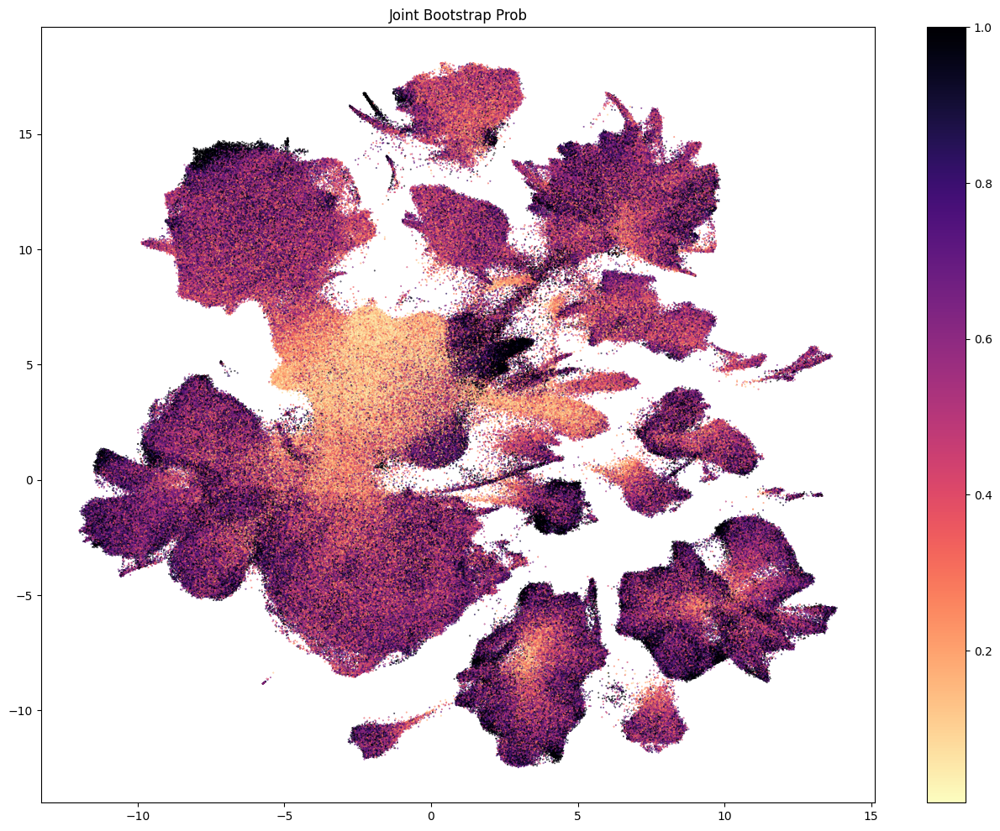

In [19]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    val=cell_siletti['subcluster_aggregate_probability'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Joint Bootstrap Prob")
plt.show()

As well as the bootstrapping probability, the correlation between the gene expression of a cell and its assigned cell type also provides vital mapping quality information. Here we colorized the PDMBS cell by the correlation coefficient of gene expression of the cell and its assigned supercluster over the set of pre-defined marker genes for the specific supercluster.

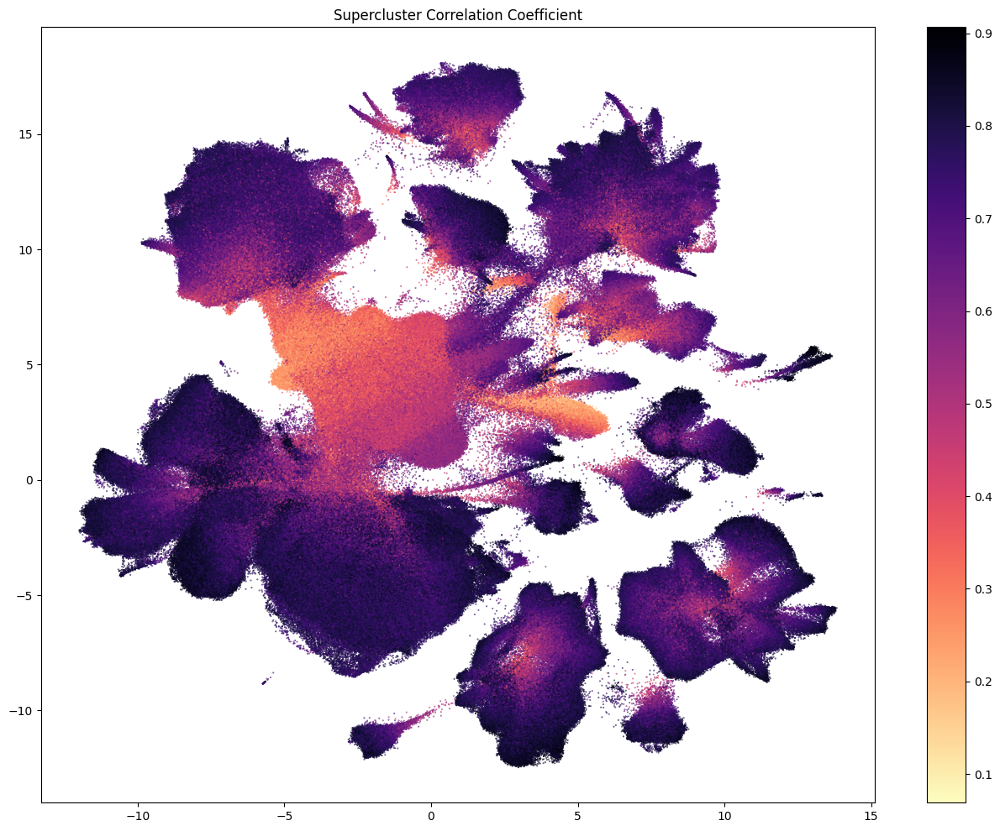

In [20]:
fig, ax = plot_umap(
    cell_siletti['x'],
    cell_siletti['y'],
    val=cell_siletti['supercluster_correlation_coefficient'],
    cmap=plt.cm.magma_r,
    fig_width=16,
    fig_height=12,
    colorbar=True
)
res = ax.set_title("Supercluster Correlation Coefficient")
plt.show()

### Removing cells with low quality mapping 

Now that we've seen the probabilities and correlations, one can make cuts on this value to only keep cells that MapMyCells is confident of. Here we make a simple cut based on supercluster probability and correlation both of 50%. This removes roughly 1/3 of the cells. These cuts are not definitive, and users should play with them to achieve a cell mapping quality to their liking. 

In [21]:
supercluster_prob05_mask = np.logical_and(
    cell_siletti['supercluster_bootstrapping_probability'] > 0.5,
    cell_siletti['supercluster_correlation_coefficient'] > 0.5
)
cell_supercluster_high = cell_siletti[supercluster_prob05_mask]
cell_supercluster_low = cell_siletti[~supercluster_prob05_mask]

After making this cut, we removed 758,985 cells with low quality assignments. As seen in the plots below, most of these cells are removed from the central region of the UMAP. The majority of Siletti clusters, the larger fraction of cells were removed from are those that were assigned Splatter cell types. 

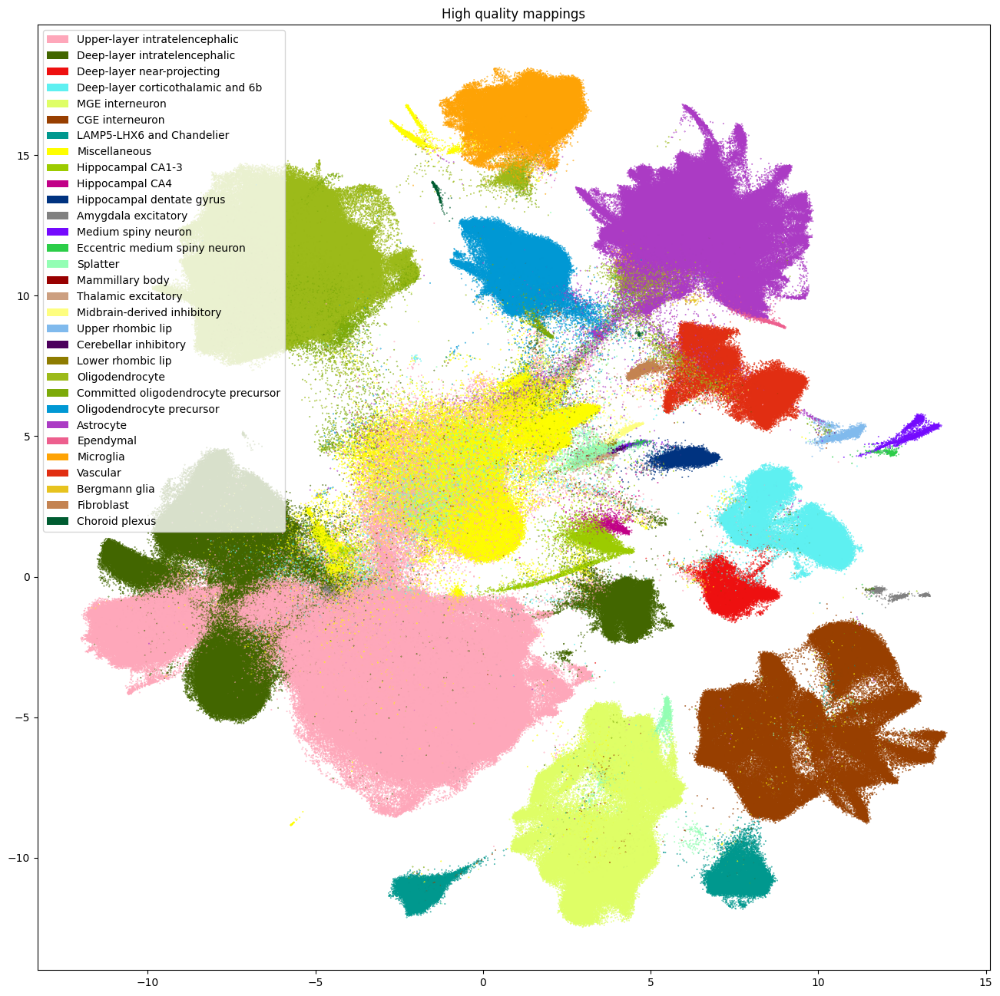

In [22]:
fig, ax = plot_umap(
    cell_supercluster_high['x'],
    cell_supercluster_high['y'],
    cc=cell_supercluster_high['supercluster'],
    labels=cell_supercluster_high['supercluster_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16
)
res = ax.set_title("High quality mappings")
plt.show()

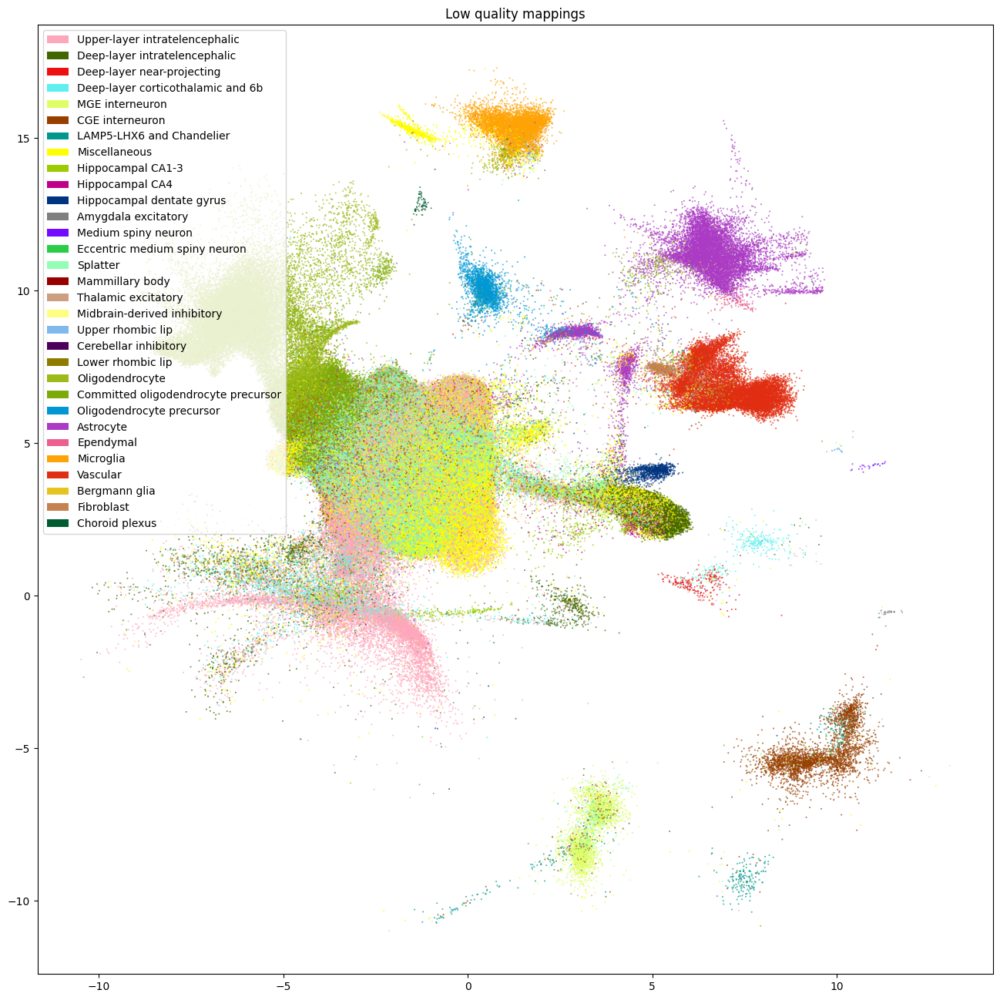

In [23]:
fig, ax = plot_umap(
    cell_supercluster_low['x'],
    cell_supercluster_low['y'],
    cc=cell_supercluster_low['supercluster'],
    labels=cell_supercluster_low['supercluster_name'],
    term_order_lookup=cluster_annotation_term,
    fig_width=16,
    fig_height=16)
res = ax.set_title("Low quality mappings")
plt.show()

## Mapping the Siletti superclusters on to the Leiden Clusters

Finally, we'll use the mapping of the cells into the Siletti taxonomy to infer mappings of the Leiden clusters that the ASAP PMDBS data provide. To do this, we'll compute the fraction of cells that are in a given Leiden cluster that were mapped into a give Siletti supercluster. 

In [24]:
# Compute the number of cells assigned in a given leiden cluster, Siletti supercluster pair.
group = cell_supercluster_high.groupby(['cluster_label', 'supercluster_name'])[['supercluster']].count()

# Create an empty dataframe to store our results for the fraction of a cluster assigned to a supercluster.
assignment_df = pd.DataFrame(
    index=cell_supercluster_high['supercluster_name'].unique(),
    columns=cell_supercluster_high['cluster_label'].unique()
).fillna(0.0)

# Compute the fraction for each leiden cluster, supercluster pair the fraction is the relative to the
# counts in the leiden supercluster.
for clust_lab in cell_supercluster_high['cluster_label'].unique():
    subgroup = group.loc[clust_lab]
    assignment_df.loc[subgroup.index, clust_lab] = (subgroup / subgroup.sum()).to_numpy()

# Make sure our dataframe rows are in ondological order.
assignment_df = assignment_df.reindex(
    sorted(assignment_df.columns), axis=1
).loc[cluster_annotation_term[
    cluster_annotation_term['cluster_annotation_term_set_name'] == 'supercluster'
].sort_values('term_order').index]

# For each supertype, retrieve the leiden clusters where that supertype has largest 
# fraction of cells from the leiden cluster assigned to it. Order the columns
# by supertype decending those maxes.
column_order = []
for row_idx, supertype in enumerate(assignment_df.index):
    saved_cols = []
    col_maxes = []
    for col in assignment_df.columns:
        max_arg = np.argmax(assignment_df[col])
        if max_arg == row_idx:
            saved_cols.append(col)
            col_maxes.append(assignment_df[col][max_arg])
    saved_cols = np.array(saved_cols)
    column_order.extend(saved_cols[np.argsort(col_maxes)[::-1]])

assignment_df = assignment_df[column_order]
assignment_df.head()

/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_53125/1207378633.py:8: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(0.0)
/var/folders/kc/7glrmt5n67x16yj_tg86t49c0000gp/T/ipykernel_53125/1207378633.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  col_maxes.append(assignment_df[col][max_arg])


,cluster_028,cluster_001,cluster_021,cluster_006,cluster_015,cluster_016,cluster_005,cluster_011,cluster_019,cluster_013,...,cluster_025,cluster_023,cluster_002,cluster_022,cluster_008,cluster_024,cluster_003,cluster_027,cluster_007,cluster_010
name,,,,,,,,,,,,,,,,,,,,,
Upper-layer intratelencephalic,0.991699,0.986873,0.981704,0.841231,0.358504,0.013095,0.014055,0.046075,0.006404,0.003158,...,0.000339,0.000882,0.000044,0.000507,0.002780,0.0,0.001021,0.005602,0.001725,0.007558
Deep-layer intratelencephalic,0.007324,0.004965,0.009295,0.154667,0.178152,0.970663,0.962783,0.943954,0.003571,0.002002,...,0.000000,0.000294,0.000080,0.000254,0.001510,0.0,0.000911,0.000000,0.000145,0.001393
Deep-layer near-projecting,0.000000,0.000022,0.000098,0.000009,0.003666,0.000000,0.000000,0.000000,0.957153,0.001601,...,0.000000,0.000000,0.000000,0.000000,0.000040,0.0,0.000000,0.000000,0.000000,0.000000
Deep-layer corticothalamic and 6b,0.000977,0.000891,0.000587,0.001016,0.100440,0.002098,0.008950,0.005556,0.021084,0.987768,...,0.000339,0.000294,0.000009,0.000000,0.000200,0.0,0.000066,0.000000,0.000158,0.000697
MGE interneuron,0.000000,0.000093,0.000391,0.000027,0.032258,0.000039,0.000037,0.000000,0.001360,0.000044,...,0.000000,0.000000,0.000030,0.000507,0.000428,0.0,0.000104,0.000000,0.000290,0.001541


In [25]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", xtick_colors=None, **kwargs):
    """
    from: https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html

    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current Axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    xtick_colors
        Set of colors to label the x ticklabels by. Must be the same length as
        col_labels. Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(range(data.shape[1]), labels=col_labels,
                  rotation=-30, ha="right", rotation_mode="anchor")
    ax.set_yticks(range(data.shape[0]), labels=row_labels)


    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    if xtick_colors is not None:
        xticks = ax.get_xticklabels()

        for idx, tick in enumerate(xticks):
            tick.set_color(xtick_colors[idx])

        ax.set_xticklabels(xticks)

    return im, cbar

Below we plot the heatmap showing the fraction of cells in a Leiden Cluster assigned to a given Siletti supertype. Note the Leiden cluster names are colored with the colors they were assigned with and shown in the [ASAP Data Overview](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_data_and_metadata.html) tutorial.

We see that some clusters have clear assignments to Siletti. The ordering we produced above shows a step like structure in the mapping. Horizontal sets show multiple Leiden clusters being assigned to a single Siletti supertype while vertical sets show Leiden clusters that have been split across multiple supertypes that are similar ontologically. We can see that there are also a few Leiden clusters that have ambiguous mappings as well, even after our cut on MapMyCells probability.

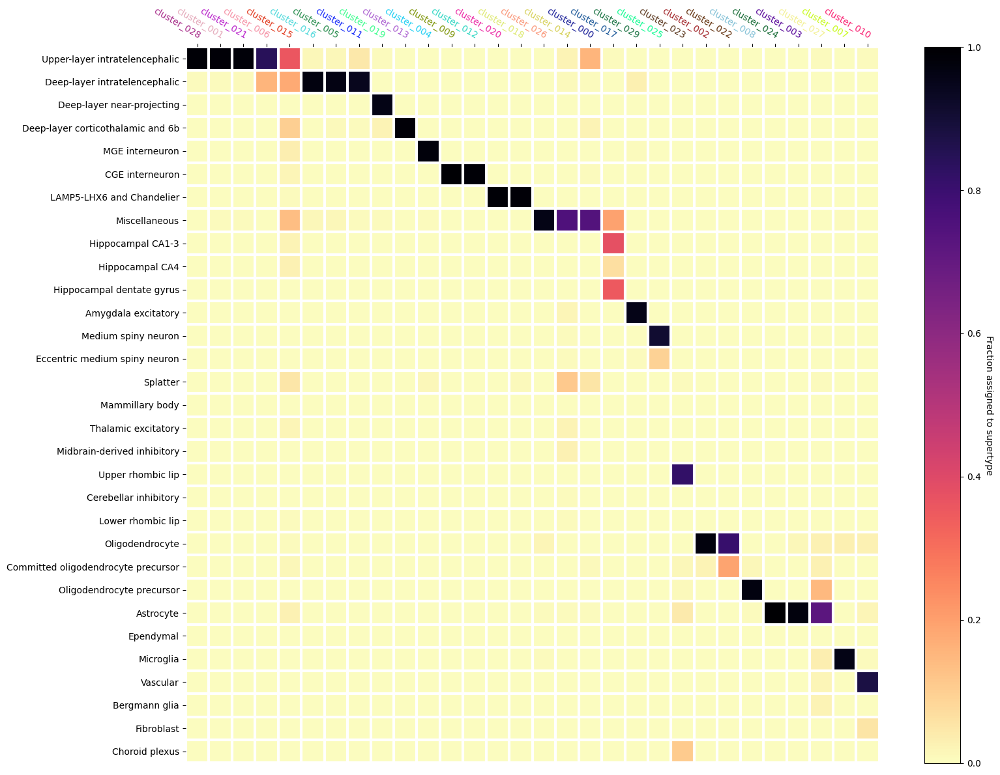

In [26]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 12)

heatmap(
    data=assignment_df,
    row_labels=assignment_df.index.to_numpy(),
    col_labels=assignment_df.columns,
    cmap=plt.cm.magma_r,
    vmin=0,
    vmax=1,
    cbarlabel="Fraction assigned to supertype",
    ax=ax,
    xtick_colors=value_sets.loc[assignment_df.columns]['color_hex_triplet'].to_numpy()
)
fig.tight_layout()

In the next notebooks, we explore a similar MapMyCells mapping with the [SEA-AD taxonomy](https://alleninstitute.github.io/abc_atlas_access/notebooks/asap_pmdbs_seaad_taxonomy.html) as well as look at [gene expression data in the UMAP](asap_pmdbs_gene_expression).